# Visualize inversion results

Use this notebook to visualize some standard inversion results.

See `utils.py` for the code to generate plots and count observations in the region of interest (imported below).

Notebook can be accessed via AWS following these instructions: https://docs.aws.amazon.com/dlami/latest/devguide/setup-jupyter.html)

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import os
import yaml
import pickle as pickle
import pandas as pd
import xesmf as xe
import cartopy.crs as ccrs
import colorcet as cc
from shapely.geometry.polygon import Polygon

from utils import plot_field, load_obj, sum_total_emissions, count_obs_in_mask

import warnings
import geopandas
import contextily as cx

warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
%pwd

## Setup

In [ ]:
# Read the configuration file
config = yaml.load(
    open("./integrated_methane_inversion/config.own.yml"), Loader=yaml.FullLoader
)

In [ ]:
# Open the state vector file
state_vector_filepath = (
    "./integrated_methane_inversion/imi_output_Texas_dir_2018/Test_IMI/StateVector.nc"
)
state_vector = xr.load_dataset(state_vector_filepath)
state_vector_labels = state_vector["StateVector"]

# Identify the last element of the region of interest
last_ROI_element = int(
    np.nanmax(state_vector_labels.values) - config["nBufferClusters"]
)

# Define mask for region of interest
mask = state_vector_labels <= last_ROI_element

In [ ]:
# Paths to prior emissions, inversion results, GEOS/satellite data, posterior simulation
prior_pth = f'./IMI/jacobian_runs_Texas_2021/{config["RunName"]}_0000/OutputDir/HEMCO_diagnostics.{config["StartDate"]}0000.nc'
results_pth = "./gridded_posterior.nc"
satdat_dir = "./data_converted"
inversion_result_path = "./inversion_result.nc"
posterior_dir = "./data_converted_posterior"
visualization_dir = "./data_visualization"
posterior_viz_dir = "./data_visualization_posterior"

In [5]:
# Set latitude/longitude bounds for plots

# Trim 1-2.5 degrees to remove GEOS-Chem buffer zone
if config["Res"] == "0.25x0.3125":
    degx = 4 * 0.3125
    degy = 4 * 0.25
elif config["Res"] == "0.5x0.625":
    degx = 4 * 0.625
    degy = 4 * 0.5

lon_bounds = [
    np.min(state_vector.lon.values) + degx,
    np.max(state_vector.lon.values) - degx,
]
lat_bounds = [
    np.min(state_vector.lat.values) + degy,
    np.max(state_vector.lat.values) - degy,
]

In [6]:
# state_vector,
state_vector_labels.shape

(33, 34)

In [7]:
lon_bounds, lat_bounds, degx, degy

([-106.25, -90.625], [25.0, 37.0], 2.5, 2.0)

## State vector

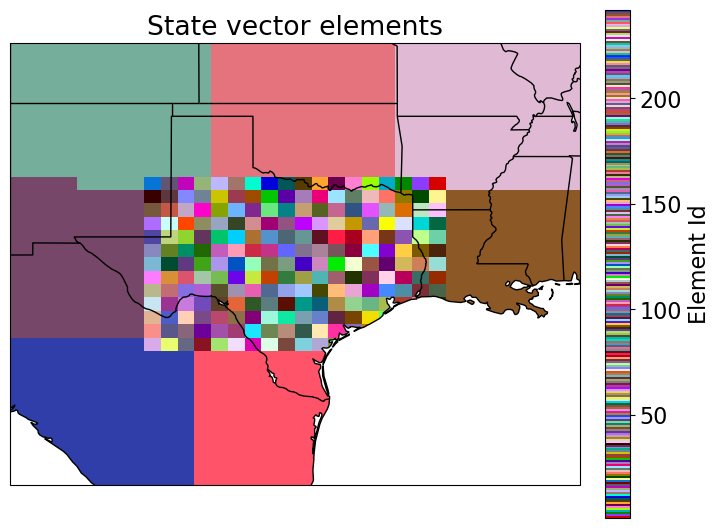

In [8]:
fig = plt.figure(figsize=(8, 8))
plt.rcParams.update({"font.size": 16})
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

# oceans_50m = cartopy.feature.NaturalEarthFeature("physical", "ocean", "50m")
# lakes_50m = cartopy.feature.NaturalEarthFeature("physical", "lakes", "50m")
# states_provinces_50m = cartopy.feature.NaturalEarthFeature("cultural", "admin_1_states_provinces_lines", "50m")
# ax.add_feature(cartopy.feature.BORDERS, facecolor="none")
# ax.add_feature(oceans_50m, facecolor=[1, 1, 1], edgecolor="black")
# ax.add_feature(lakes_50m, facecolor=[1, 1, 1], edgecolor="black")
# ax.add_feature(states_provinces_50m, facecolor="none", edgecolor="black")
# ax.set_title('State vector elements')
# state_vector_labels.plot.pcolormesh(cmap=cc.cm.glasbey,levels=None,ax=ax,cbar_kwargs={"label": 'Element Id', "fraction": 0.041, "pad": 0.04})
# plt.savefig('test.png')

plot_field(
    ax,
    state_vector_labels,
    cmap=cc.cm.glasbey,
    title="State vector elements",
    cbar_label="Element Id",
)

## Prior & Posterior emission

In [9]:
# Prior emissions
prior = xr.load_dataset(prior_pth)["EmisCH4_Total"].isel(time=0)

# Optimized scale factors
scale = xr.load_dataset(results_pth)["ScaleFactor"]

# Posterior emissions
posterior = prior * scale

In [10]:
xr.load_dataset(results_pth)

<xarray.Dataset>
Dimensions:      (lat: 33, lon: 34)
Coordinates:
  * lon          (lon) float32 -108.8 -108.1 -107.5 ... -89.38 -88.75 -88.12
  * lat          (lat) float32 23.0 23.5 24.0 24.5 25.0 ... 37.5 38.0 38.5 39.0
Data variables:
    ScaleFactor  (lat, lon) float64 2.285 2.285 2.285 ... 2.744 2.744 2.744
    S_post       (lat, lon) float64 0.0212 0.0212 0.0212 ... 0.1553 0.1553
    A            (lat, lon) float64 0.9152 0.9152 0.9152 ... 0.379 0.379 0.379

In [25]:
prior_wetlands = xr.load_dataset(prior_pth)["EmisCH4_Wetlands"].isel(time=0)
prior_livestock = xr.load_dataset(prior_pth)["EmisCH4_Livestock"].isel(time=0)
prior_oil_gas = xr.load_dataset(prior_pth)["EmisCH4_Oil"].isel(
    time=0
) + xr.load_dataset(prior_pth)["EmisCH4_Gas"].isel(time=0)
prior_landfills = xr.load_dataset(prior_pth)["EmisCH4_Landfills"].isel(time=0)
prior_coal = xr.load_dataset(prior_pth)["EmisCH4_Coal"].isel(time=0)
prior_wastewater = xr.load_dataset(prior_pth)["EmisCH4_Wastewater"].isel(time=0)
prior_otherna = (
    xr.load_dataset(prior_pth)["EmisCH4_BiomassBurn"].isel(time=0)
    + xr.load_dataset(prior_pth)["EmisCH4_Termites"].isel(time=0)
    + xr.load_dataset(prior_pth)["EmisCH4_Seeps"].isel(time=0)
)
prior_otheranth = xr.load_dataset(prior_pth)["EmisCH4_OtherAnth"].isel(time=0)
prior_soilabs = xr.load_dataset(prior_pth)["EmisCH4_SoilAbsorb"].isel(time=0)
prior_rice = xr.load_dataset(prior_pth)["EmisCH4_Rice"].isel(time=0)
prior_lake = xr.load_dataset(prior_pth)["EmisCH4_Lakes"].isel(time=0)
prior

<xarray.DataArray 'EmisCH4_Total' (lat: 32, lon: 33)>
array([[4.3707242e-14, 4.3707242e-14, 6.4512073e-13, ..., 7.5870354e-13,
        7.5870354e-13, 7.5870354e-13],
       [4.3707242e-14, 4.3707242e-14, 6.4512073e-13, ..., 7.5870354e-13,
        7.5870354e-13, 7.5870354e-13],
       [4.5815684e-13, 4.5815684e-13, 1.1001398e-12, ..., 3.7971828e-13,
        3.7971828e-13, 3.7971828e-13],
       ...,
       [3.1989758e-11, 7.6028281e-11, 9.9238749e-11, ..., 7.1401794e-11,
        5.1418918e-11, 9.3739280e-11],
       [3.5563469e-11, 3.9811442e-11, 4.2915824e-11, ..., 8.1611565e-11,
        2.5452848e-10, 1.0962701e-09],
       [2.1488330e-11, 6.2775923e-11, 3.2645792e-11, ..., 1.7365588e-10,
        1.6331778e-10, 7.7441789e-11]], dtype=float32)
Coordinates:
  * lon      (lon) float64 -108.8 -108.1 -107.5 -106.9 ... -90.0 -89.38 -88.75
  * lat      (lat) float64 23.0 23.5 24.0 24.5 25.0 ... 36.5 37.0 37.5 38.0 38.5
    time     datetime64[ns] 2021-01-01
Attributes:
    long_name:         CH4_emissions_from_all_sectors
    units:             kg/m2/s
    averaging_method:  mean

/var/tmp/pbs.8468130.pbs/ipykernel_4164127/4007832193.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=2.0)


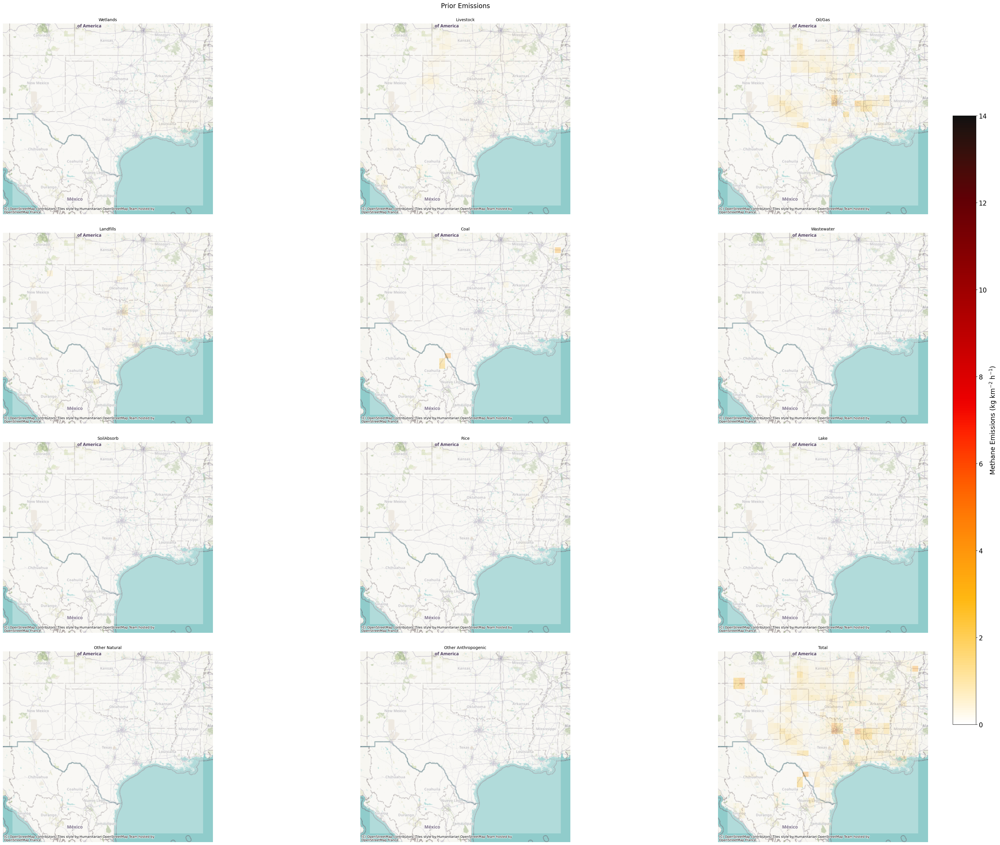

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(40, 30))

###
df = pd.DataFrame(
    {
        "Latitude": np.array([[v.values] * len(prior.lon) for v in prior.lat]).reshape(
            -1
        ),
        "Longitude": list(prior.lon.values) * len(prior.lat),
        "prior_wetlands": np.array(prior_wetlands * (1000**2) * 60 * 60).reshape(-1),
        "prior_livestock": np.array(prior_livestock * (1000**2) * 60 * 60).reshape(-1),
        "prior_oil_gas": np.array(prior_oil_gas * (1000**2) * 60 * 60).reshape(-1),
        "prior_landfills": np.array(prior_landfills * (1000**2) * 60 * 60).reshape(-1),
        "prior_coal": np.array(prior_coal * (1000**2) * 60 * 60).reshape(-1),
        "prior_wastewater": np.array(prior_wastewater * (1000**2) * 60 * 60).reshape(
            -1
        ),
        "prior_soilabs": np.array(prior_soilabs * (1000**2) * 60 * 60).reshape(-1),
        "prior_rice": np.array(prior_rice * (1000**2) * 60 * 60).reshape(-1),
        "prior_lake": np.array(prior_lake * (1000**2) * 60 * 60).reshape(-1),
        "prior_otherna": np.array(prior_otherna * (1000**2) * 60 * 60).reshape(-1),
        "prior_otheranth": np.array(prior_otheranth * (1000**2) * 60 * 60).reshape(-1),
        "prior_total": np.array(prior * (1000**2) * 60 * 60).reshape(-1),
    }
)
geo_df = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude), crs="EPSG:4326"
)
points = geopandas.points_from_xy(df.Longitude, df.Latitude)
polygons = []
for point in points:
    x, y = point.x, point.y
    quad = Polygon([(x, y), (x, y + 0.5), (x + 0.625, y + 0.5), (x + 0.625, y)])
    polygons.append(quad)

geo_df["polygons"] = polygons
geo_df = geo_df.set_geometry("polygons")
df_wm = geo_df.to_crs(epsg=3857)
ax = df_wm.plot(
    column="prior_wetlands",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[0, 0],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_livestock",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[0, 1],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_oil_gas",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[0, 2],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_landfills",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[1, 0],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_coal",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[1, 1],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_wastewater",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[1, 2],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_soilabs",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[2, 0],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_rice",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[2, 1],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_lake",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[2, 2],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_otherna",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[3, 0],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_otheranth",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[3, 1],
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_total",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[3, 2],
    #                                 legend=True, legend_kwds={"label": "Emissions (kg km$^{-2}$ h$^{-1}$)", "orientation": "vertical"},
)
ax.set_axis_off()
cx.add_basemap(ax)

axes[0, 0].set_title("Wetlands", fontsize=10)
axes[0, 1].set_title("Livestock", fontsize=10)
axes[0, 2].set_title("Oil/Gas", fontsize=10)
axes[1, 0].set_title("Landfills", fontsize=10)
axes[1, 1].set_title("Coal", fontsize=10)
axes[1, 2].set_title("Wastewater", fontsize=10)
axes[2, 0].set_title("SoilAbsorb", fontsize=10)
axes[2, 1].set_title("Rice", fontsize=10)
axes[2, 2].set_title("Lake", fontsize=10)
axes[3, 0].set_title("Other Natural", fontsize=10)
axes[3, 1].set_title("Other Anthropogenic", fontsize=10)
axes[3, 2].set_title("Total", fontsize=10)

# divider = make_axes_locatable(axes[3,2])
# cax = divider.append_axes("right", size="5%", pad=0.1)
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Adjust colorbar position
sm = plt.cm.ScalarMappable(
    cmap=cc.cm.linear_kryw_5_100_c67_r, norm=plt.Normalize(vmin=0, vmax=14)
)
sm.set_array([])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("Methane Emissions (kg km$^{-2}$ h$^{-1}$)")

fig.suptitle("Prior Emissions", fontsize=16)

# Automatically adjust the spacing between subgraphs
plt.tight_layout(pad=2.0)

# Savee
plt.savefig("../../../Figures/Prior Emissions.png")
plt.show()

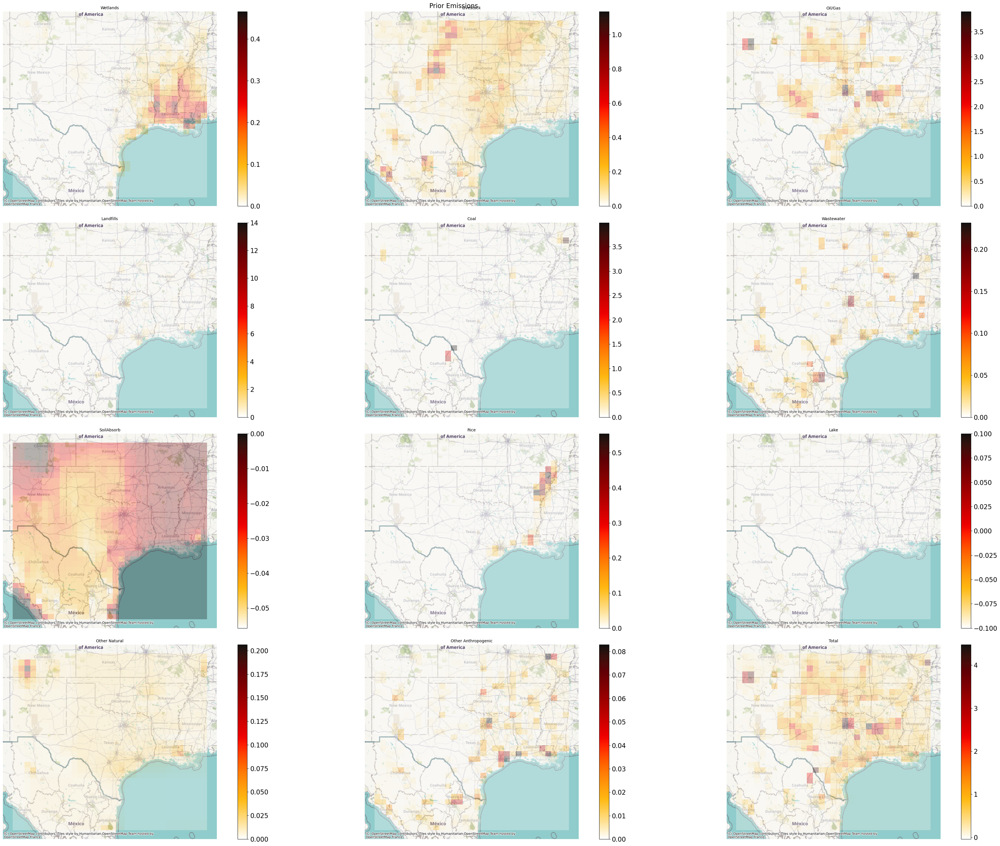

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(40, 30))

###
df = pd.DataFrame(
    {
        "Latitude": np.array([[v.values] * len(prior.lon) for v in prior.lat]).reshape(
            -1
        ),
        "Longitude": list(prior.lon.values) * len(prior.lat),
        "prior_wetlands": np.array(prior_wetlands * (1000**2) * 60 * 60).reshape(-1),
        "prior_livestock": np.array(prior_livestock * (1000**2) * 60 * 60).reshape(-1),
        "prior_oil_gas": np.array(prior_oil_gas * (1000**2) * 60 * 60).reshape(-1),
        "prior_landfills": np.array(prior_landfills * (1000**2) * 60 * 60).reshape(-1),
        "prior_coal": np.array(prior_coal * (1000**2) * 60 * 60).reshape(-1),
        "prior_wastewater": np.array(prior_wastewater * (1000**2) * 60 * 60).reshape(
            -1
        ),
        "prior_soilabs": np.array(prior_soilabs * (1000**2) * 60 * 60).reshape(-1),
        "prior_rice": np.array(prior_rice * (1000**2) * 60 * 60).reshape(-1),
        "prior_lake": np.array(prior_lake * (1000**2) * 60 * 60).reshape(-1),
        "prior_otherna": np.array(prior_otherna * (1000**2) * 60 * 60).reshape(-1),
        "prior_otheranth": np.array(prior_otheranth * (1000**2) * 60 * 60).reshape(-1),
        "prior_total": np.array(prior * (1000**2) * 60 * 60).reshape(-1),
    }
)
geo_df = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude), crs="EPSG:4326"
)
points = geopandas.points_from_xy(df.Longitude, df.Latitude)
polygons = []
for point in points:
    x, y = point.x, point.y
    quad = Polygon([(x, y), (x, y + 0.5), (x + 0.625, y + 0.5), (x + 0.625, y)])
    polygons.append(quad)

geo_df["polygons"] = polygons
geo_df = geo_df.set_geometry("polygons")
df_wm = geo_df.to_crs(epsg=3857)
ax = df_wm.plot(
    column="prior_wetlands",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[0, 0],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_livestock",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[0, 1],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_oil_gas",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[0, 2],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_landfills",
    figsize=(10, 10),
    alpha=0.3,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[1, 0],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_coal",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[1, 1],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_wastewater",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[1, 2],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_soilabs",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[2, 0],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_rice",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[2, 1],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_lake",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[2, 2],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_otherna",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[3, 0],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_otheranth",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[3, 1],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

ax = df_wm.plot(
    column="prior_total",
    figsize=(10, 10),
    alpha=0.3,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    ax=axes[3, 2],
    legend=True,
)
ax.set_axis_off()
cx.add_basemap(ax)

axes[0, 0].set_title("Wetlands", fontsize=10)
axes[0, 1].set_title("Livestock", fontsize=10)
axes[0, 2].set_title("Oil/Gas", fontsize=10)
axes[1, 0].set_title("Landfills", fontsize=10)
axes[1, 1].set_title("Coal", fontsize=10)
axes[1, 2].set_title("Wastewater", fontsize=10)
axes[2, 0].set_title("SoilAbsorb", fontsize=10)
axes[2, 1].set_title("Rice", fontsize=10)
axes[2, 2].set_title("Lake", fontsize=10)
axes[3, 0].set_title("Other Natural", fontsize=10)
axes[3, 1].set_title("Other Anthropogenic", fontsize=10)
axes[3, 2].set_title("Total", fontsize=10)

fig.suptitle("Prior Emissions", fontsize=16)

plt.tight_layout()

plt.savefig("../../../Figures/Prior Emissions v2.png")
plt.show()

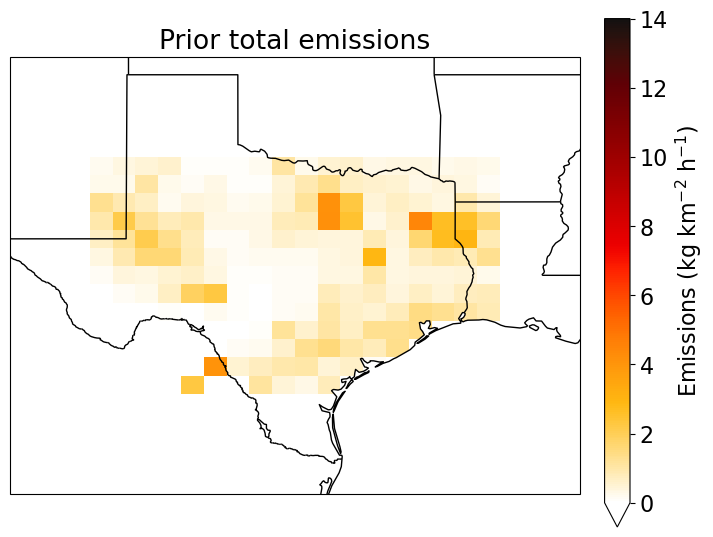

In [11]:
# prior_landfills = xr.load_dataset(prior_pth)['EmisCH4_Wetlands'].isel(time=0)
# prior_wetlands = xr.load_dataset(prior_pth)['EmisCH4_Wetlands'].isel(time=0)
# prior_livestock = xr.load_dataset(prior_pth)['EmisCH4_Livestock'].isel(time=0)
# prior_oil_gas = xr.load_dataset(prior_pth)['EmisCH4_Oil'].isel(time=0)+xr.load_dataset(prior_pth)['EmisCH4_Gas'].isel(time=0)
# prior_landfills = xr.load_dataset(prior_pth)['EmisCH4_Landfills'].isel(time=0)
# prior_coal = xr.load_dataset(prior_pth)['EmisCH4_Coal'].isel(time=0)
# prior_wastewater = xr.load_dataset(prior_pth)['EmisCH4_Wastewater'].isel(time=0)
# prior_otherna =  xr.load_dataset(prior_pth)['EmisCH4_BiomassBurn'].isel(time=0)+ xr.load_dataset(prior_pth)['EmisCH4_Termites'].isel(time=0)+ xr.load_dataset(prior_pth)['EmisCH4_Seeps'].isel(time=0)
# prior_otheranth =  xr.load_dataset(prior_pth)['EmisCH4_OtherAnth'].isel(time=0)
# prior_soilabs = xr.load_dataset(prior_pth)['EmisCH4_SoilAbsorb'].isel(time=0)
# prior_rice = xr.load_dataset(prior_pth)['EmisCH4_Rice'].isel(time=0)
# prior_lake = xr.load_dataset(prior_pth)['EmisCH4_Lakes'].isel(time=0)
fig = plt.figure(figsize=(8, 8))
plt.rcParams.update({"font.size": 16})
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

prior_kgkm2h = prior * (1000**2) * 60 * 60  # Units kg/km2/h


plot_field(
    ax,
    prior_kgkm2h,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    vmin=0,
    vmax=14,
    title="Prior total emissions",
    cbar_label="Emissions (kg km$^{-2}$ h$^{-1}$)",
    #            mask=mask,
    only_ROI=True,
    state_vector_labels=state_vector_labels,
    last_ROI_element=last_ROI_element,
)

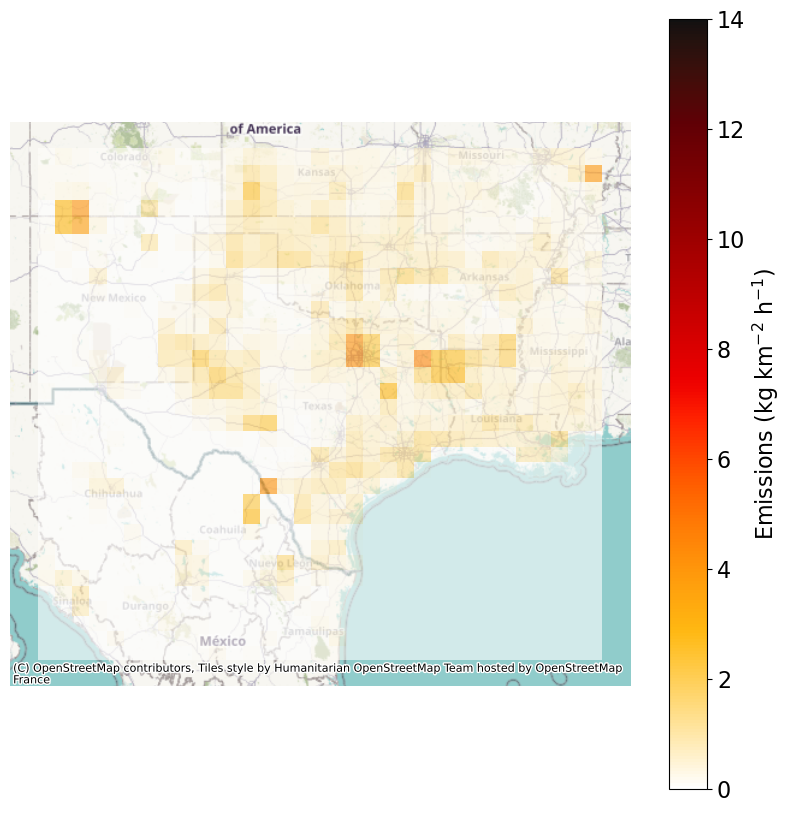

In [29]:
df = pd.DataFrame(
    {
        "Latitude": np.array([[v.values] * len(prior.lon) for v in prior.lat]).reshape(
            -1
        ),
        "Longitude": list(prior.lon.values) * len(prior.lat),
        "Methane": np.array(prior * (1000**2) * 60 * 60).reshape(-1),
    }
)
geo_df = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude), crs="EPSG:4326"
)
points = geopandas.points_from_xy(df.Longitude, df.Latitude)
polygons = []
for point in points:
    x, y = point.x, point.y
    quad = Polygon([(x, y), (x, y + 0.5), (x + 0.625, y + 0.5), (x + 0.625, y)])
    polygons.append(quad)

geo_df["polygons"] = polygons
geo_df = geo_df.set_geometry("polygons")

# ax = geo_df.plot(column="Methane", legend=True, figsize=(10, 10), alpha=0.5, edgecolor="k")

df_wm = geo_df.to_crs(epsg=3857)

ax = df_wm.plot(
    column="Methane",
    legend=True,
    figsize=(10, 10),
    alpha=0.6,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    legend_kwds={
        "label": "Emissions (kg km$^{-2}$ h$^{-1}$)",
        "orientation": "vertical",
    },
)

cx.add_basemap(ax)
ax.set_axis_off()

In [30]:
# Total emissions in the region of interest

areas = xr.load_dataset(prior_pth)["AREA"]

total_prior_emissions = sum_total_emissions(prior, areas, mask)
total_posterior_emissions = sum_total_emissions(posterior, areas, mask)

print("Prior     emissions :", total_prior_emissions, "Tg/y")
print("Posterior emissions :", total_posterior_emissions, "Tg/y")

Prior     emissions : 4.148100062182832 Tg/y
Posterior emissions : 6.631431416792619 Tg/y


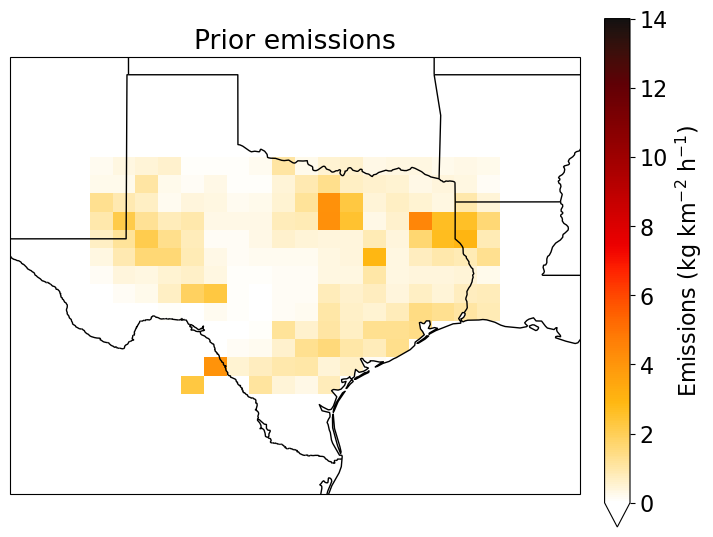

In [35]:
# Plot prior emissions
fig = plt.figure(figsize=(8, 8))
plt.rcParams.update({"font.size": 16})
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

prior_kgkm2h = prior * (1000**2) * 60 * 60  # Units kg/km2/h


plot_field(
    ax,
    prior_kgkm2h,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    vmin=0,
    vmax=14,
    title="Prior emissions",
    cbar_label="Emissions (kg km$^{-2}$ h$^{-1}$)",
    #            mask=mask,
    only_ROI=True,
    state_vector_labels=state_vector_labels,
    last_ROI_element=last_ROI_element,
)

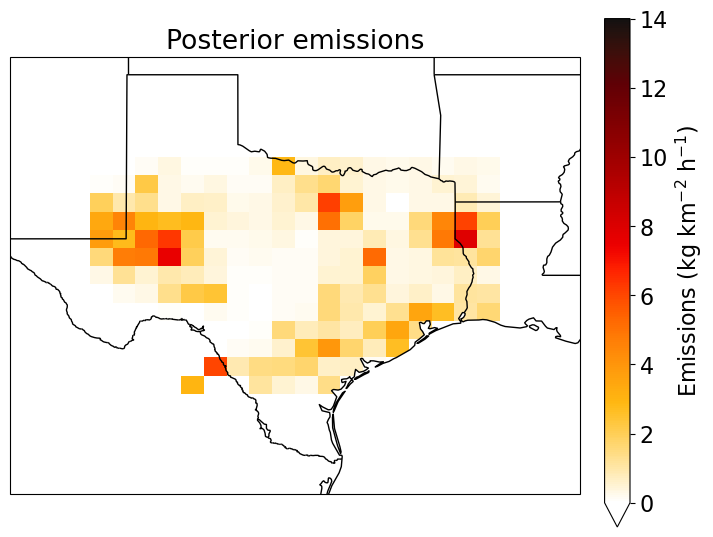

In [34]:
# Plot posterior emissions
fig = plt.figure(figsize=(8, 8))
plt.rcParams.update({"font.size": 16})
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

posterior_kgkm2h = posterior * (1000**2) * 60 * 60  # Units kg/km2/h

plot_field(
    ax,
    posterior_kgkm2h,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    vmin=0,
    vmax=14,
    title="Posterior emissions",
    cbar_label="Emissions (kg km$^{-2}$ h$^{-1}$)",
    #            mask=mask,
    only_ROI=True,
    state_vector_labels=state_vector_labels,
    last_ROI_element=last_ROI_element,
)

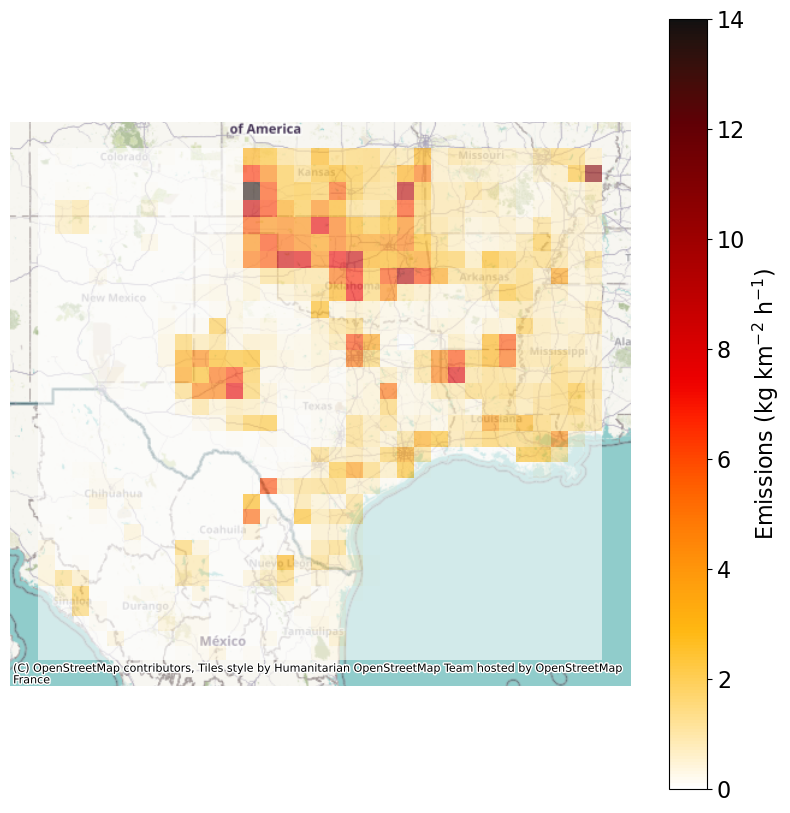

In [36]:
df = pd.DataFrame(
    {
        "Latitude": np.array(
            [[v.values] * len(posterior.lon) for v in posterior.lat]
        ).reshape(-1),
        "Longitude": list(posterior.lon.values) * len(prior.lat),
        "Methane": np.array(posterior * (1000**2) * 60 * 60).reshape(-1),
    }
)
geo_df = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude), crs="EPSG:4326"
)
points = geopandas.points_from_xy(df.Longitude, df.Latitude)
polygons = []
for point in points:
    x, y = point.x, point.y
    quad = Polygon([(x, y), (x, y + 0.5), (x + 0.625, y + 0.5), (x + 0.625, y)])
    polygons.append(quad)

geo_df["polygons"] = polygons
geo_df = geo_df.set_geometry("polygons")

# ax = geo_df.plot(column="Methane", legend=True, figsize=(10, 10), alpha=0.5, edgecolor="k")

df_wm = geo_df.to_crs(epsg=3857)

ax = df_wm.plot(
    column="Methane",
    legend=True,
    figsize=(10, 10),
    alpha=0.6,
    vmin=0,
    vmax=14,
    cmap=cc.cm.linear_kryw_5_100_c67_r,
    legend_kwds={
        "label": "Emissions (kg km$^{-2}$ h$^{-1}$)",
        "orientation": "vertical",
    },
)

cx.add_basemap(ax)
ax.set_axis_off()

## Scale factors

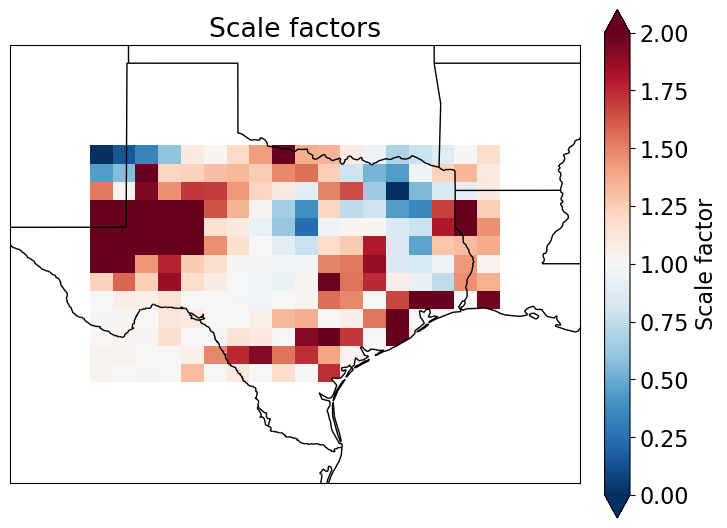

In [19]:
fig = plt.figure(figsize=(8, 8))
plt.rcParams.update({"font.size": 16})
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

plot_field(
    ax,
    scale,
    cmap="RdBu_r",
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    vmin=0,
    vmax=2,
    title="Scale factors",
    cbar_label="Scale factor",
    only_ROI=True,
    state_vector_labels=state_vector_labels,
    last_ROI_element=last_ROI_element,
)

## Averaging kernel sensitivities

In [20]:
S_post_grid = xr.load_dataset(results_pth)["S_post"]
A_grid = xr.load_dataset(results_pth)["A"]
avkern_ROI = A_grid.where(state_vector_labels <= last_ROI_element)

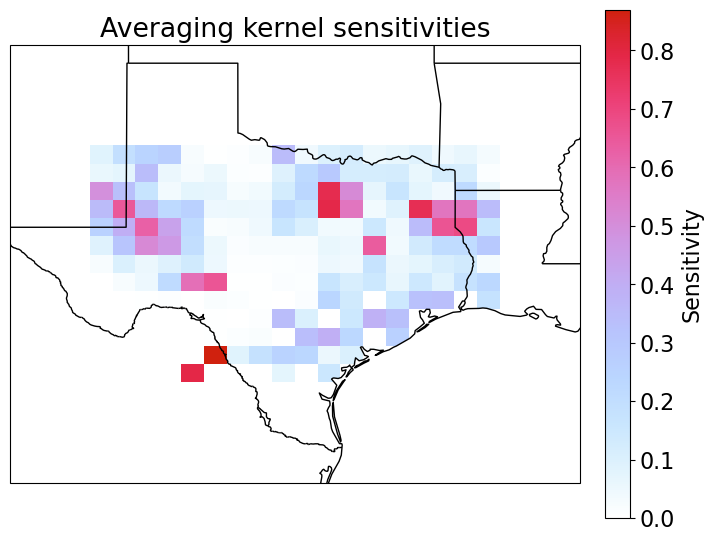

In [21]:
fig = plt.figure(figsize=(8, 8))
plt.rcParams.update({"font.size": 16})
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

plot_field(
    ax,
    avkern_ROI,
    cmap=cc.cm.CET_L19,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="Averaging kernel sensitivities",
    cbar_label="Sensitivity",
    only_ROI=True,
    state_vector_labels=state_vector_labels,
    last_ROI_element=last_ROI_element,
)

In [22]:
# ungridded inversion result is used to calculate DOFS using the trace of the averaging kernel
A_ROI = xr.load_dataset(inversion_result_path)["A"].values[
    :last_ROI_element, :last_ROI_element
]
DOFS = np.trace(A_ROI)
print("DOFS =", DOFS)

DOFS = 31.884647


## Open TROPOMI and GEOS-Chem columns

In [33]:
# Get observed and GEOS-Chem-simulated TROPOMI columns
def aggregate_data(data_dir, data_posterior):
    files = np.sort(os.listdir(data_dir))
    lat = np.array([])
    lon = np.array([])
    tropomi = np.array([])
    geos_prior = np.array([])
    geos_posterior = np.array([])
    observation_count = np.array([])

    for f in files:
        # Get paths
        pth = os.path.join(data_dir, f)
        pth_posterior = os.path.join(data_posterior, f)
        # Load TROPOMI/GEOS-Chem and Jacobian matrix data from the .pkl file
        obj = load_obj(pth)
        obj_posterior = load_obj(pth_posterior)
        # If there aren't any TROPOMI observations on this day, skip
        if obj["obs_GC"].shape[0] == 0:
            continue
        # Otherwise, grab the TROPOMI/GEOS-Chem data
        obs_GC = obj["obs_GC"]
        obs_GC_posterior = obj_posterior["obs_GC"]
        # Only consider data within latitude and longitude bounds
        ind = np.where(
            (obs_GC[:, 2] >= lon_bounds[0])
            & (obs_GC[:, 2] <= lon_bounds[1])
            & (obs_GC[:, 3] >= lat_bounds[0])
            & (obs_GC[:, 3] <= lat_bounds[1])
        )
        if len(ind[0]) == 0:  # Skip if no data in bounds
            continue
        obs_GC = obs_GC[ind[0], :]  # TROPOMI and GEOS-Chem data within bounds
        obs_GC_posterior = obs_GC_posterior[ind[0], :]
        # Record lat, lon, tropomi ch4, and geos ch4
        lat = np.concatenate((lat, obs_GC[:, 3]))
        lon = np.concatenate((lon, obs_GC[:, 2]))
        tropomi = np.concatenate((tropomi, obs_GC[:, 0]))
        geos_prior = np.concatenate((geos_prior, obs_GC[:, 1]))
        observation_count = np.concatenate((observation_count, obs_GC[:, 4]))
        geos_posterior = np.concatenate((geos_posterior, obs_GC_posterior[:, 1]))

    df = pd.DataFrame()
    df["lat"] = lat
    df["lon"] = lon
    df["tropomi"] = tropomi
    df["geos_prior"] = geos_prior
    df["geos_posterior"] = geos_posterior
    df["diff_tropomi_prior"] = geos_prior - tropomi
    df["diff_tropomi_posterior"] = geos_posterior - tropomi
    df["observation_count"] = observation_count

    return df


superobs_df = aggregate_data(satdat_dir, posterior_dir)
visualization_df = aggregate_data(visualization_dir, posterior_viz_dir)
n_obs = len(superobs_df["tropomi"])

print(
    f'Found {n_obs} super-observations in the domain, representing {np.sum(superobs_df["observation_count"]).round(0)} TROPOMI observations.'
)
superobs_df.head()

Found 77250 super-observations in the domain, representing 1986835.0 TROPOMI observations.


,lat,lon,tropomi,geos_prior,geos_posterior,diff_tropomi_prior,diff_tropomi_posterior,observation_count
0,36.748528,-100.858994,1852.463013,1849.054443,1850.323975,-3.408569,-2.139038,0.432928
1,35.640556,-100.313080,1860.421753,1850.511475,1851.041504,-9.910278,-9.380249,3.115884
2,36.040131,-100.467110,1850.267334,1850.142090,1851.549683,-0.125244,1.282349,11.526994
3,36.518715,-100.587158,1856.850830,1849.059448,1851.095093,-7.791382,-5.755737,19.880337
4,34.741199,-99.858444,1889.296875,1862.816650,1866.235474,-26.480225,-23.061401,1.296209


Note: This observation count is for the lat/lon bounds defined in input cell 5.

In [34]:
# Print some error statistics
print(
    "Bias in prior     :",
    np.round(
        np.average(
            superobs_df["diff_tropomi_prior"], weights=superobs_df["observation_count"]
        ),
        2,
    ),
    "ppb",
)
print(
    "Bias in posterior :",
    np.round(
        np.average(
            superobs_df["diff_tropomi_posterior"],
            weights=superobs_df["observation_count"],
        ),
        2,
    ),
    "ppb",
)
print(
    "RMSE prior        :",
    np.round(
        np.sqrt(
            np.average(
                superobs_df["diff_tropomi_prior"] ** 2,
                weights=superobs_df["observation_count"],
            )
        ),
        2,
    ),
    "ppb",
)
print(
    "RMSE posterior    :",
    np.round(
        np.sqrt(
            np.average(
                superobs_df["diff_tropomi_posterior"] ** 2,
                weights=superobs_df["observation_count"],
            )
        ),
        2,
    ),
    "ppb",
)

Bias in prior     : -3.0 ppb
Bias in posterior : 1.24 ppb
RMSE prior        : 11.77 ppb
RMSE posterior    : 11.52 ppb


## Count observations within the region of interest

In [35]:
print(
    "Found",
    count_obs_in_mask(mask, superobs_df),
    "super-observations within the region of interest",
)

Found 31473 super-observations within the region of interest


## Compare TROPOMI and GEOS-Chem columns

### Comparison at 0.1 x 0.1 resolution

In [36]:
# Simple averaging scheme to grid the XCH4 data at 0.1 x 0.1 resolution
df_copy = visualization_df.copy()  # save for later
visualization_df["lat"] = np.round(visualization_df["lat"], 1)
visualization_df["lon"] = np.round(visualization_df["lon"], 1)
visualization_df = visualization_df.groupby(["lat", "lon"]).mean()
# ds = visualization_df.to_xarray()

In [37]:
ds = xr.Dataset.from_dataframe(visualization_df)

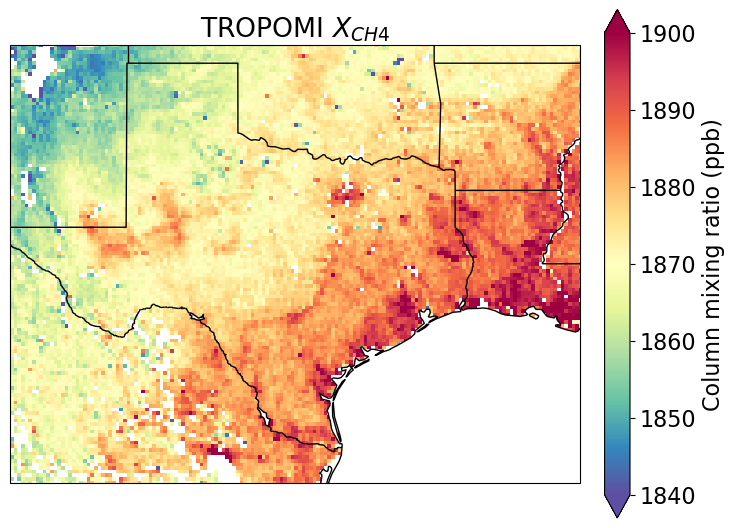

In [40]:
# Mean TROPOMI XCH4 columns on 0.1 x 0.1 grid
fig = plt.figure(figsize=(8, 8))
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

plot_field(
    ax,
    ds["tropomi"],
    cmap="Spectral_r",
    vmin=1840,
    vmax=1900,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="TROPOMI $X_{CH4}$",
    cbar_label="Column mixing ratio (ppb)",
    #            mask=mask,
    only_ROI=False,
)

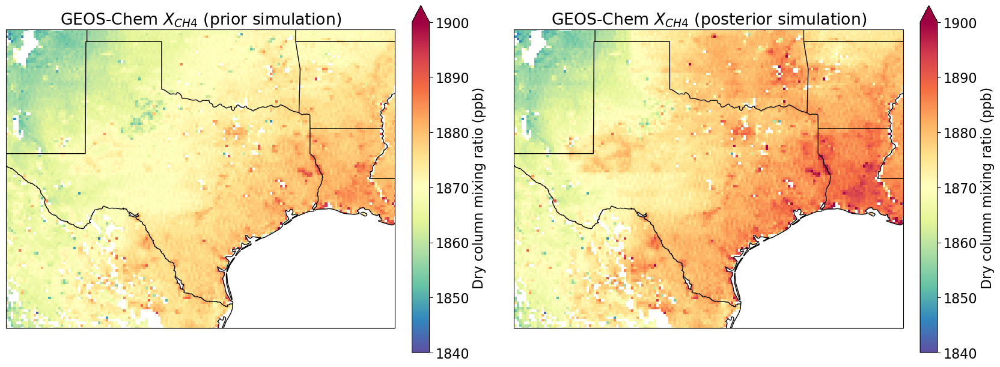

In [41]:
# Mean prior and posterior GEOS-Chem XCH4 columns on 0.1 x 0.1 grid
fig = plt.figure(figsize=(20, 8))
ax1, ax2 = fig.subplots(1, 2, subplot_kw={"projection": ccrs.PlateCarree()})

plot_field(
    ax1,
    ds["geos_prior"],
    cmap="Spectral_r",
    vmin=1840,
    vmax=1900,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="GEOS-Chem $X_{CH4}$ (prior simulation)",
    cbar_label="Dry column mixing ratio (ppb)",
    #            mask=mask,
    only_ROI=False,
)

plot_field(
    ax2,
    ds["geos_posterior"],
    cmap="Spectral_r",
    vmin=1840,
    vmax=1900,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="GEOS-Chem $X_{CH4}$ (posterior simulation)",
    cbar_label="Dry column mixing ratio (ppb)",
    #            mask=mask,
    only_ROI=False,
)

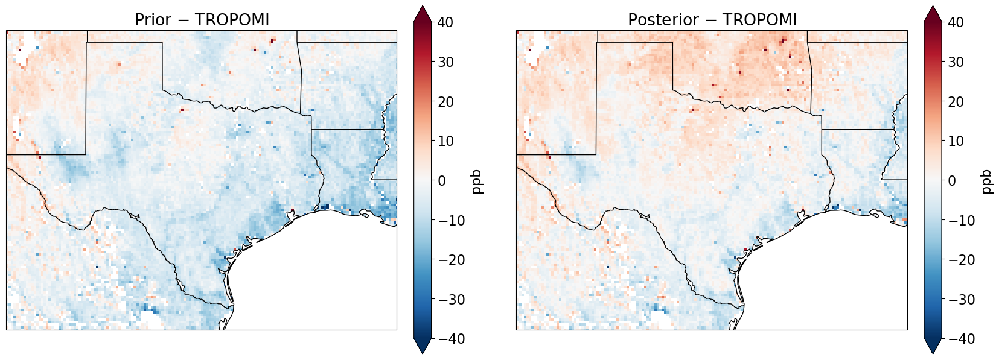

In [30]:
# Plot differences between GEOS-Chem and TROPOMI XCH4
fig = plt.figure(figsize=(20, 8))
ax1, ax2 = fig.subplots(1, 2, subplot_kw={"projection": ccrs.PlateCarree()})

plot_field(
    ax1,
    ds["diff_tropomi_prior"],
    cmap="RdBu_r",
    vmin=-40,
    vmax=40,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="Prior $-$ TROPOMI",
    cbar_label="ppb",
    #            mask=mask,
    only_ROI=False,
)

plot_field(
    ax2,
    ds["diff_tropomi_posterior"],
    cmap="RdBu_r",
    vmin=-40,
    vmax=40,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="Posterior $-$ TROPOMI",
    cbar_label="ppb",
    #            mask=mask,
    only_ROI=False,
)

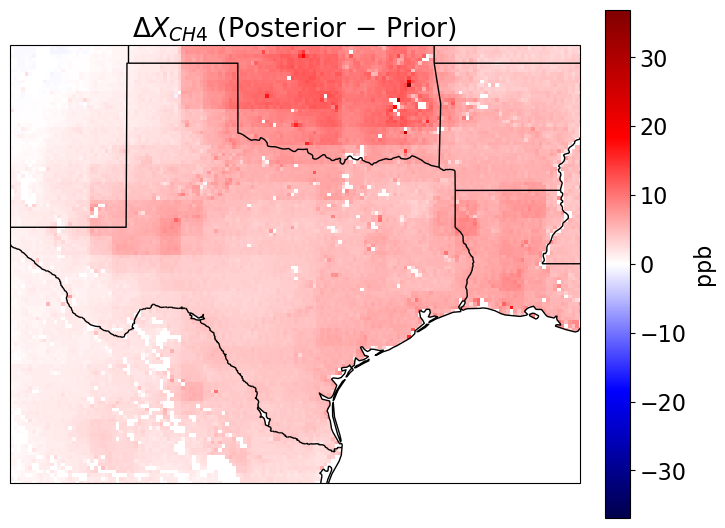

In [31]:
# Plot differences between posterior and prior simulated XCH4
fig = plt.figure(figsize=(8, 8))
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

diff = ds["geos_posterior"] - ds["geos_prior"]

plot_field(
    ax,
    diff,
    cmap="seismic",
    vmin=-np.nanmax(diff),
    vmax=np.nanmax(diff),
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="$\Delta X_{CH4}$ (Posterior $-$ Prior)",
    cbar_label="ppb",
    #            mask=mask,
    only_ROI=False,
)

### Comparison at 0.25 x 0.3125 resolution

In [32]:
# Simple averaging scheme to grid the XCH4 data at 0.1 x 0.1 resolution
df_copy = superobs_df.copy()  # save for later
superobs_df["lat"] = np.round(superobs_df["lat"], 1)
superobs_df["lon"] = np.round(superobs_df["lon"], 1)
superobs_df = superobs_df.groupby(["lat", "lon"]).mean()
# ds = superobs_df.to_xarray()
ds = xr.Dataset.from_dataframe(superobs_df)

In [33]:
# calculate the grid bounds for .1x.1 grid
lat_b = np.arange(ds["lat"][0] - 0.05, ds["lat"][-1] + 0.1, 0.1)
lon_b = np.arange(ds["lon"][0] - 0.05, ds["lon"][-1] + 0.1, 0.1)
ds = ds.assign_coords(lon_b=("lon_b", lon_b))
ds = ds.assign_coords(lat_b=("lat_b", lat_b))
ds["mask"] = xr.where(~np.isnan(ds["tropomi"]), 1, 0)

In [29]:
# new_lat_b.shape,new_lat_grid.shape,new_lon_grid.shape,new_lon_b.shape

In [30]:
# ds_out,ds

In [34]:
# Global 0.25 x 0.3125 grid
reference_lat_grid = np.arange(-90, 90 + 0.25, 0.25)
reference_lon_grid = np.arange(-180, 180 + 0.3125, 0.3125)

# Find closest reference coordinates to selected lat/lon bounds
lat_min = reference_lat_grid[np.abs(reference_lat_grid - lat_bounds[0]).argmin()]
lon_min = reference_lon_grid[np.abs(reference_lon_grid - lon_bounds[0]).argmin()]
lat_max = reference_lat_grid[np.abs(reference_lat_grid - lat_bounds[1]).argmin()]
lon_max = reference_lon_grid[np.abs(reference_lon_grid - lon_bounds[1]).argmin()]

# Create an xESMF regridder object to resample the data on the grid HEMCO expects
new_lat_grid = np.arange(lat_min, lat_max + 0.25, 0.25)
new_lon_grid = np.arange(lon_min, lon_max + 0.3125, 0.3125)
new_lat_b = np.arange(new_lat_grid[0] - 0.125, new_lat_grid[-1] + 0.25, 0.25)
new_lon_b = np.arange(new_lon_grid[0] - 0.15625, new_lon_grid[-1] + 0.3125, 0.3125)
ds_out = xr.Dataset(
    {
        "lat": (["lat"], new_lat_grid),
        "lon": (["lon"], new_lon_grid),
        "lat_b": (["lat_b"], new_lat_b),
        "lon_b": (["lon_b"], new_lon_b),
    }
)

# regridder = xe.Regridder(ds, ds_out, 'conservative_normed')
regridder = xe.Regridder(ds, ds_out, method="bilinear")
# regridder = xe.Regridder(ds, ds_out, method='conservative')

In [35]:
# Regrid the data
ds_regrid = regridder(ds)

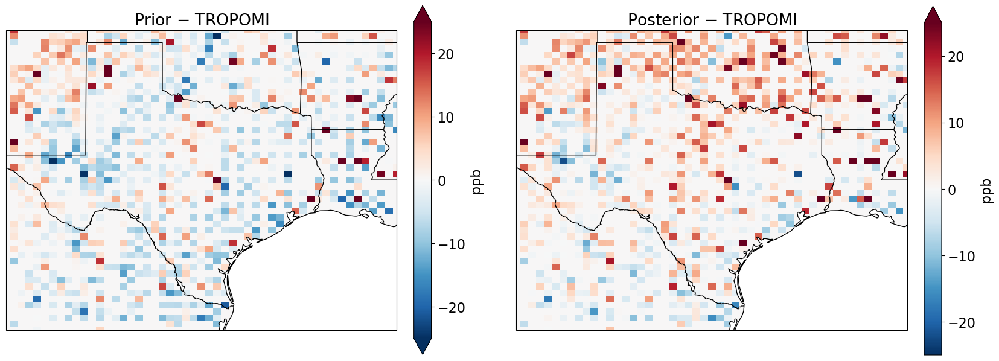

In [36]:
# Re-plot differences between GEOS-Chem and TROPOMI XCH4
fig = plt.figure(figsize=(20, 8))
ax1, ax2 = fig.subplots(1, 2, subplot_kw={"projection": ccrs.PlateCarree()})

plot_field(
    ax1,
    ds_regrid["diff_tropomi_prior"],
    cmap="RdBu_r",
    vmin=-25,
    vmax=25,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="Prior $-$ TROPOMI",
    cbar_label="ppb",
    #            mask=mask,
    only_ROI=False,
)

plot_field(
    ax2,
    ds_regrid["diff_tropomi_posterior"],
    cmap="RdBu_r",
    vmin=-25,
    vmax=25,
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="Posterior $-$ TROPOMI",
    cbar_label="ppb",
    #            mask=mask,
    only_ROI=False,
)

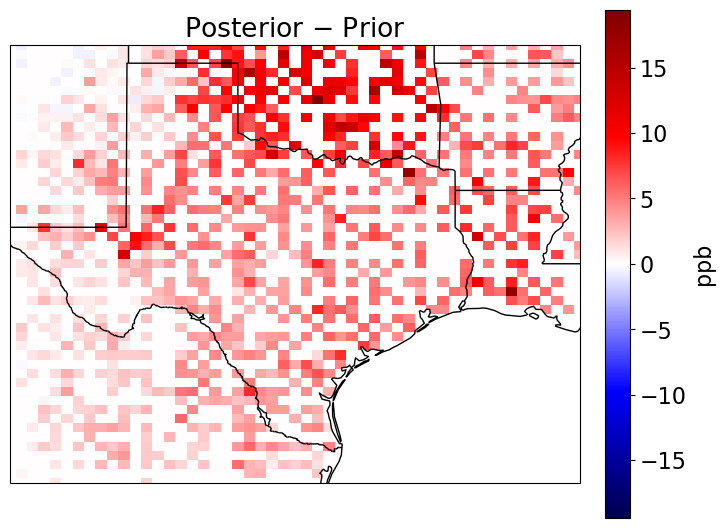

In [37]:
# Re-plot differences between posterior and prior simulated XCH4
fig = plt.figure(figsize=(8, 8))
ax = fig.subplots(1, 1, subplot_kw={"projection": ccrs.PlateCarree()})

diff_regrid = ds_regrid["geos_posterior"] - ds_regrid["geos_prior"]

plot_field(
    ax,
    diff_regrid,
    cmap="seismic",
    vmin=-np.nanmax(diff_regrid),
    vmax=np.nanmax(diff_regrid),
    lon_bounds=lon_bounds,
    lat_bounds=lat_bounds,
    title="Posterior $-$ Prior",
    cbar_label="ppb",
    #            mask=mask,
    only_ROI=False,
)

----